# TME 1 - Density Estimation




In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import pandas as pd
import scipy.stats

POI_FILENAME = "poi-paris.pkl"
parismap = mpimg.imread('paris-48.806-2.23--48.916-2.48.jpg')
## coordonnees GPS de la carte
xmin, xmax = 2.23, 2.48  # coord_x min et max
ymin, ymax = 48.806, 48.916  # coord_y min et max
coords = [xmin, xmax, ymin, ymax]


def get_density2D(f,data,steps=100):
    """ Calcule la densité en chaque case d'une grille steps x steps dont les bornes sont calculées à partir du min/max de data. Renvoie la grille estimée et la discrétisation sur chaque axe.
    """
    xmin, xmax = data[:,0].min(), data[:,0].max()
    ymin, ymax = data[:,1].min(), data[:,1].max()
    xlin,ylin = np.linspace(xmin,xmax,steps),np.linspace(ymin,ymax,steps)
    xx, yy = np.meshgrid(xlin,ylin)
    grid = np.c_[xx.ravel(), yy.ravel()]
    res = f.predict(grid).reshape(steps, steps)
    return res, xlin, ylin

def show_density(f, data, steps=100, log=False):
    """ Dessine la densité f et ses courbes de niveau sur une grille 2D calculée à partir de data, avec un pas de discrétisation de steps. Le paramètre log permet d'afficher la log densité plutôt que la densité brute
    """
    res, xlin, ylin = get_density2D(f, data, steps)
    xx, yy = np.meshgrid(xlin, ylin)
    plt.figure()
    show_img()
    if log:
        res = np.log(res+1e-10)
    plt.scatter(data[:, 0], data[:, 1], alpha=0.8, s=3)
    show_img(res)
    plt.colorbar()
    plt.contour(xx, yy, res, 20)


def show_img(img=parismap):
    """ Affiche une matrice ou une image selon les coordonnées de la carte de Paris.
    """
    origin = "lower" if len(img.shape) == 2 else "upper"
    alpha = 0.3 if len(img.shape) == 2 else 1.
    plt.imshow(img, extent=coords, aspect=1.5, origin=origin, alpha=alpha)
    ## extent pour controler l'echelle du plan


def load_poi(typepoi,fn=POI_FILENAME):
    """ Dictionaire POI, clé : type de POI, valeur : dictionnaire des POIs de ce type : (id_POI, [coordonnées, note, nom, type, prix])
    
    Liste des POIs : furniture_store, laundry, bakery, cafe, home_goods_store, 
    clothing_store, atm, lodging, night_club, convenience_store, restaurant, bar
    """
    poidata = pickle.load(open(fn, "rb"))
    data = np.array([[v[1][0][1],v[1][0][0]] for v in sorted(poidata[typepoi].items())])
    note = np.array([v[1][1] for v in sorted(poidata[typepoi].items())])
    return data,note
    

In [2]:
class Density(object):
    def fit(self,data):
        pass
    def predict(self,data):
        pass
    def score(self,data):
        likelihoods = self.predict(data)
        likelihoods = np.clip(likelihoods,1e-10,None)
        return np.sum(np.log(likelihoods))


**Question: Why adding very small value to likelihood?**

We add very small value to the likelihood because if the likelihood is 0 we get an error. Small value will not change anything but prevent an error. 

## Displaying different POIs on the map

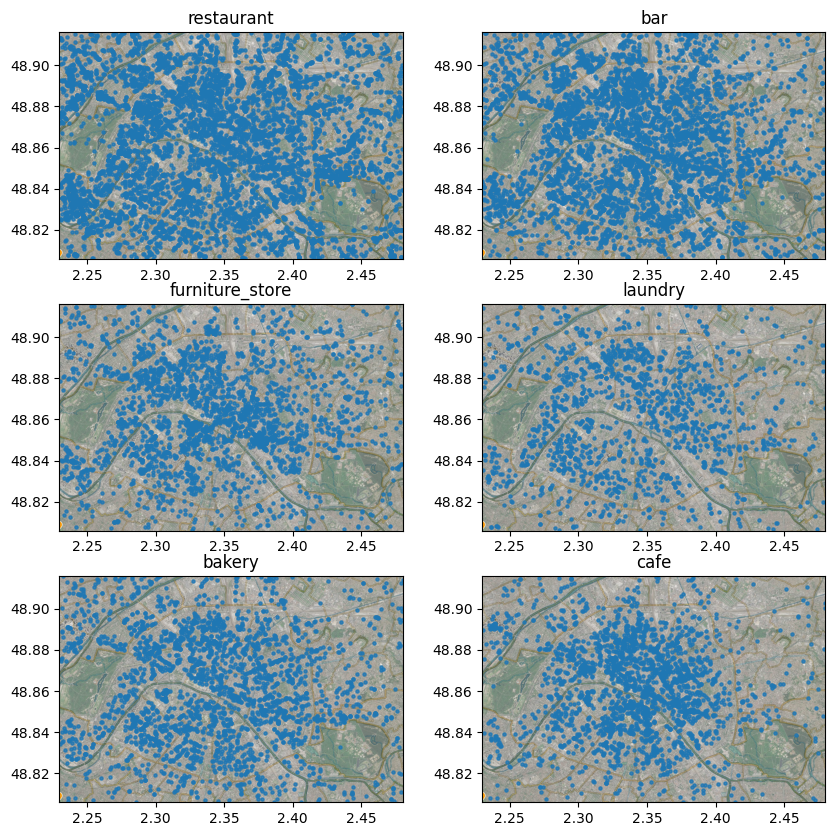

In [3]:
plt.figure(figsize=(10,10))
data_places = ['restaurant','bar','furniture_store','laundry','bakery','cafe']
for i,place in enumerate(data_places):
    plt.subplot(3,2,i+1)
    geo_mat, notes = load_poi(place)
    show_img()
    plt.scatter(geo_mat[:,0], geo_mat[:,1], alpha=0.8, s=5, label=place)
    plt.title(place)

plt.show()




## Histogram Method

It is a method used to estimate probability density by counting number of points. For the continous data we divide it into bins by the discretization step. 

Limitations 

- In high dimensionality – exponential growth of bins  
- Many empty bins or with few samples 
- Poor representativeness 
- Very sensitive to discretization step 


In [4]:
class Histogramme(Density):
    def __init__(self,steps=10):
        Density.__init__(self)
        self.steps = steps
        self.histogram = None

    def fit(self,x):
        self.histogram , self.edges = np.histogramdd(x, bins=self.steps) #calculate how many points are in each bin
        return self.histogram, self.edges

    def to_bin(self, x):
        bin_indices = []
        for dim, val in enumerate(x):  
            #np.digitize is a NumPy function that is used to determine the indices of bins that correspond to given values, based on a set of bin edges.
            bin_index = np.digitize(val, self.edges[dim]) -1# -1 to convert to 0-based index
            bin_index = min(max(bin_index, 0), len(self.edges[dim]) - 2)# Ensure bin_index is within the valid range
            bin_indices.append(bin_index)
        return tuple(bin_indices) #return the bin indices as a tuple
            
    def predict(self,x):
        densities = []
        width_dim = [self.edges[d][1] - self.edges[d][0] for d in range(len(self.edges))]
        
        all_points = self.histogram.sum()
        #print(f"Total points: {all_points}")
        for point_x0 in x:
            bin_index = self.to_bin(point_x0)
            bin_count = self.histogram[bin_index]
            #print(f"Point: {point_x0}, Bin index: {bin_index}, Bin count: {bin_count}")
            density_point = bin_count / (all_points)
            densities.append(density_point)
        return np.array(densities)

### Verify densities

If there are no errors the density should sum up to 1. The density sum up to 1 in almost all of the displayed maps. There is one that is significantly close to 1 so we can conclude that the estimator is correct.

Sum of the densities for:restaurant 1.0
Sum of the densities for:bar 1.0
Sum of the densities for:furniture_store 1.0
Sum of the densities for:laundry 0.9999999999999999
Sum of the densities for:bakery 1.0
Sum of the densities for:cafe 1.0


<function matplotlib.pyplot.show(close=None, block=None)>

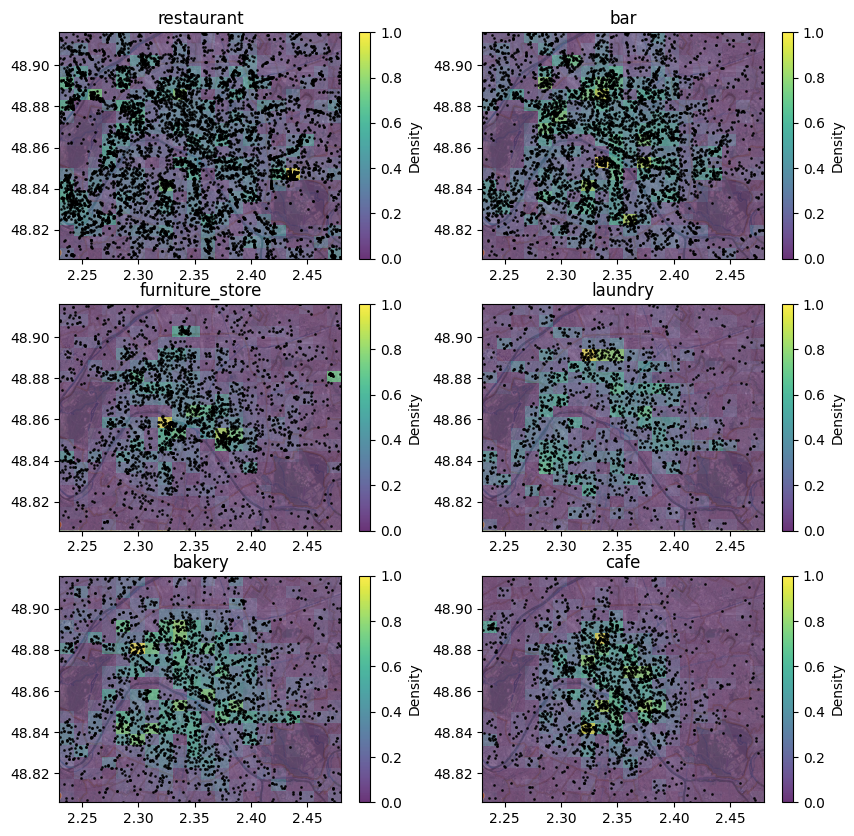

In [5]:
#check histogram 
plt.figure(figsize=(10,10))
data_places = ['restaurant','bar','furniture_store','laundry','bakery','cafe']
hist_estimator= Histogramme(steps=20)

#plot 
for i,place in enumerate(data_places):
    geo_mat, notes = load_poi(place)
    hist, edges = hist_estimator.fit(geo_mat)

    plt.subplot(3,2,i+1)
    show_img()
    plt.imshow(hist.T, extent=[edges[0][0], edges[0][-1], edges[1][0], edges[1][-1]], aspect='auto',cmap='viridis', origin='lower', alpha=0.5)
    plt.scatter(geo_mat[:,0], geo_mat[:,1], alpha=0.8, s=1, color="black",label=place)
    plt.title(place)
    plt.colorbar(label='Density')
    density_grid, xlin, ylin = get_density2D(hist_estimator, geo_mat, steps=20)

    print(f"Sum of the densities for:{place}", np.sum(density_grid))
 
#print("Density Grid:\n", density_grid) 
plt.show

### Display and compare different discretization steps

Discretization step == nb of bins (per dimension)

For the very small discretization steps (0-10) we do not get much information about the density of bars because it does not split the grid enough to get meaningful information (underfitting). If we increase the step we get densities that are more split and localized which gives us more information about the locations with many bars. However, if the step is too high (70) the step is soo large that the grid is split into tiny bins so we estimate each point which is not very meaningful to read (here overfitting). We can conclude that the middle step size (around 15) is the best for density estimation and its validity to our purpose. 

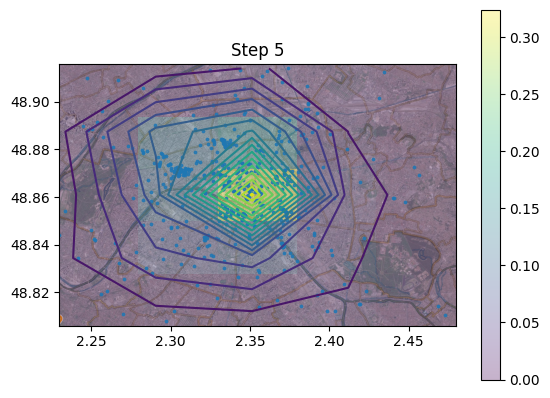

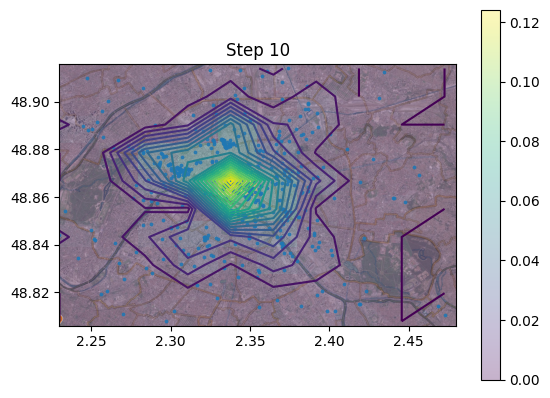

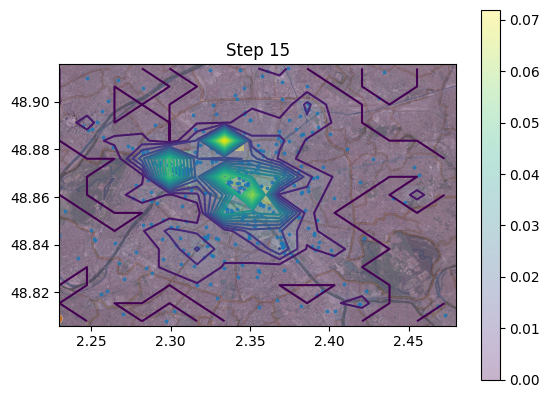

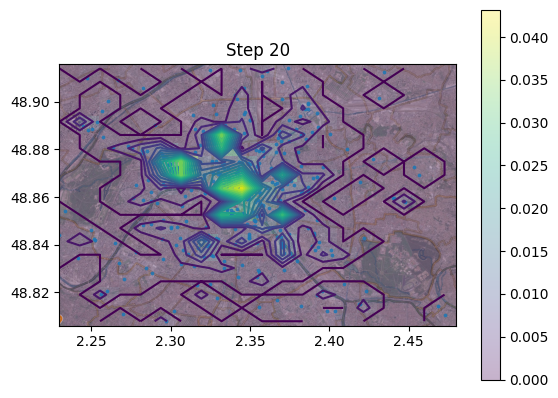

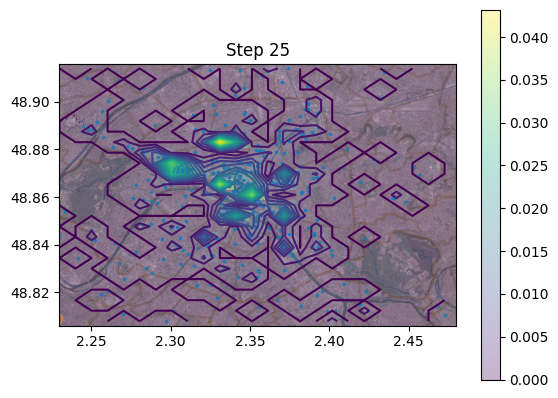

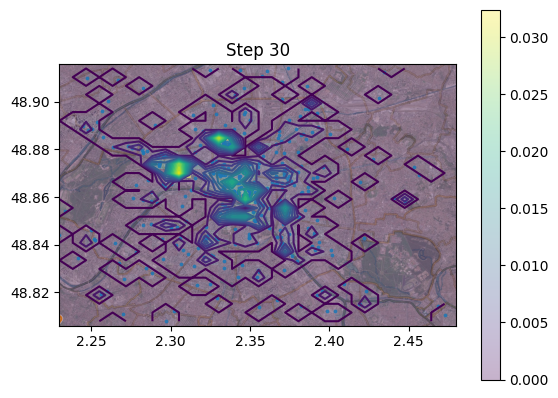

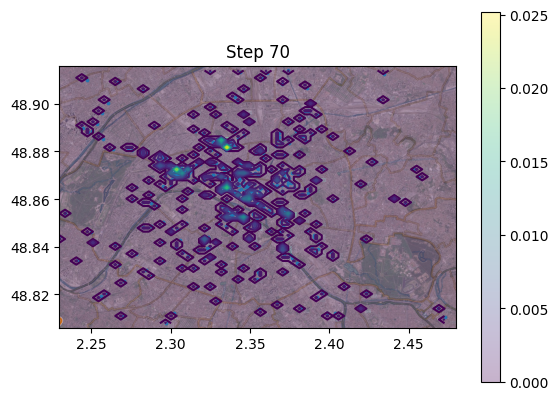

In [6]:
disc_step = [5,10,15,20,25,30,70]
#data_place  = 'bar'
data_place = 'night_club'
geo_mat, notes = load_poi(data_place)
for i, step in enumerate(disc_step):
    hist_estimator= Histogramme(steps=step)
    hist, edges = hist_estimator.fit(geo_mat)
    show_density(hist_estimator, geo_mat, steps=step)
    plt.title(f"Step {step}")
plt.show()


### Cross-validation

Here I split the data into train (70% of data) and test (30%). This method is called cross-validation and it is used to test how well the method generalizes. Training and testing on the same data may enhance overfitting, the accuracy might be too high because we are merely fitting the model not caring for future/new data predictions. 

Based on the likelohood plots we can observe that the likelihood becomes more negative with higher step, more bins. This might be because many bins have small nb of points or 0 point, so the probability is low and likelihood negative. 
Based on the likelihood only the best step would be the minimum (5 for us). However, we should balance the likelihood and meaningful information, getting high likelihood does not necessarily guarantee the best information so it is important to visualize the results. 

$$
p(h \in T_j) = \frac{P(H \in T_j)}{\Delta}
$$


Best step for bar: 5


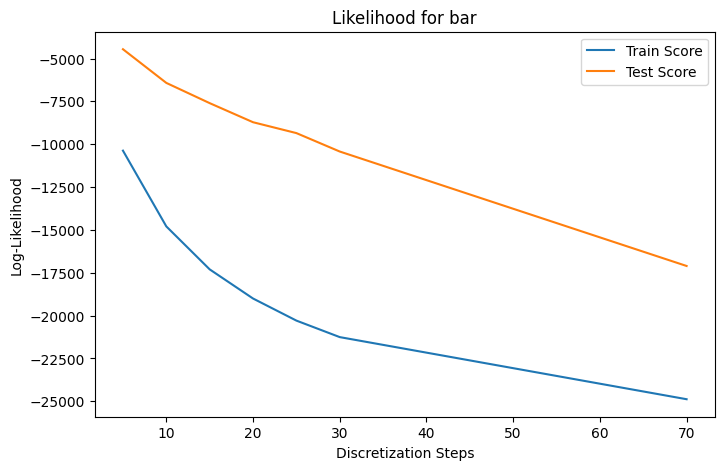

Best step for night_club: 5


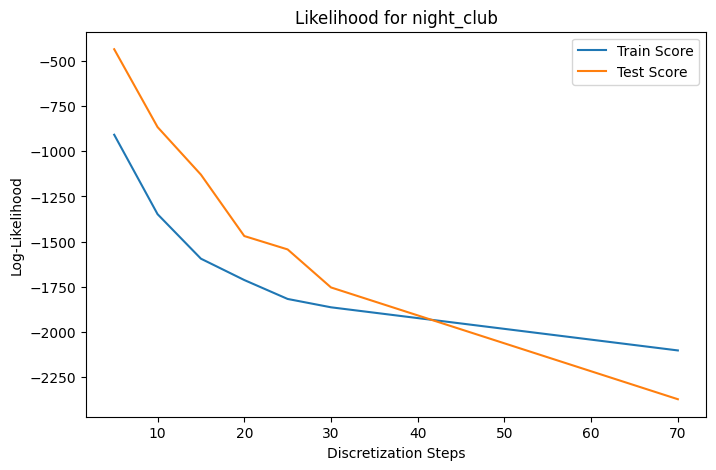

In [7]:
np.random.seed(2)
np.random.shuffle(geo_mat)


# Fit the histogram model to the training data  
disc_step = [5,10,15,20,25,30,70]
data_place  = ['bar','night_club']

for i, place in enumerate(data_place):
    geo_mat, notes = load_poi(place)
    split = int(len(geo_mat) * 0.7)
    data_train  = geo_mat[:split]
    data_test = geo_mat[split:]
    log_likelihood_train = []
    log_likelihood_test = []
    best_log_likelihood = []

    for s, step in enumerate(disc_step):
        hist_estimator= Histogramme(steps=step)
        hist, edges = hist_estimator.fit(data_train)
        log_likelihood_train.append(hist_estimator.score(data_train))
        log_likelihood_test.append(hist_estimator.score(data_test))
        best_log_likelihood.append((log_likelihood_test, step))
    best_log_like, best_step = max(best_log_likelihood, key=lambda x: x[0])
    print(f"Best step for {place}: {best_step}")

    plt.figure(figsize=(8,5))
    plt.plot(disc_step, log_likelihood_train, label='Train Score')
    plt.plot(disc_step, log_likelihood_test, label='Test Score')
    plt.title(f"Likelihood for {place}")
    plt.xlabel('Discretization Steps')
    plt.ylabel('Log-Likelihood')
    plt.legend()
    plt.show()

  

## Kernel Methods

Is another method for density estimation. To account for the limitation of the discretization step, here we use kernel density estimation. Kernel is a function that is applied to the point creating a space around it (comparable to the window or hypercube) however, more smooth in this case. It gives different weights to the points depending on their distance to the target point. 

Gaussian kernel is smoother than the uniform kernel. Uniform kernel can be compared to the window. 


In [8]:
def kernel_uniform(x):
    res = []
    for point in x:
        if all(abs(point[i]) <= 0.5 for i in range(len(point))):
            res.append(1)
        else:
            res.append(0)
    return np.array(res)

def kernel_gaussian(x):
    x = np.array(x) 
    len_points = np.linalg.norm(x, axis=1) 
    res = (2 * np.pi) ** (-x.shape[1] / 2) * np.exp(-0.5 * len_points**2)
    return res

In [9]:
class KernelDensity(Density):
    def __init__(self,kernel=None,sigma=0.1):
        Density.__init__(self)
        self.kernel = kernel
        self.sigma = sigma
    def fit(self,x):
        self.x = x
    def predict(self,data):
        res = []
        for point in data:
            z = (point - self.x) / self.sigma
            sum_k = np.sum(self.kernel(z))
            f_x = sum_k / (len(self.x) * (self.sigma ** self.x.shape[1]))
            res.append(f_x)
            
        return np.array(res)


### Validity of the kernel method

Again to check if we obtain valid results we sum up the densities. They sum up to 1 so we can assume the estimated densities are valid. 

In [ ]:
def show_density_new(f, data, steps=10, log=False):

    res, xlin, ylin = get_density2D(f, data, steps)
    xx, yy = np.meshgrid(xlin, ylin)
    show_img()
    if log:
        res = np.log(res+1e-10)
    show_img(res)
    plt.contour(xx, yy, res, 20)
    plt.scatter(data[:, 0], data[:, 1], alpha=0.8, s=3)


Sum of the densities for restaurant with sigma 0.01:  1.0
Sum of the densities for restaurant with sigma 0.1:  1.0
Sum of the densities for restaurant with sigma 0.3:  1.0
Sum of the densities for restaurant with sigma 0.4:  1.0
Sum of the densities for restaurant with sigma 0.01:  1.0
Sum of the densities for restaurant with sigma 0.1:  1.0
Sum of the densities for restaurant with sigma 0.3:  1.0000000000000002
Sum of the densities for restaurant with sigma 0.4:  1.0


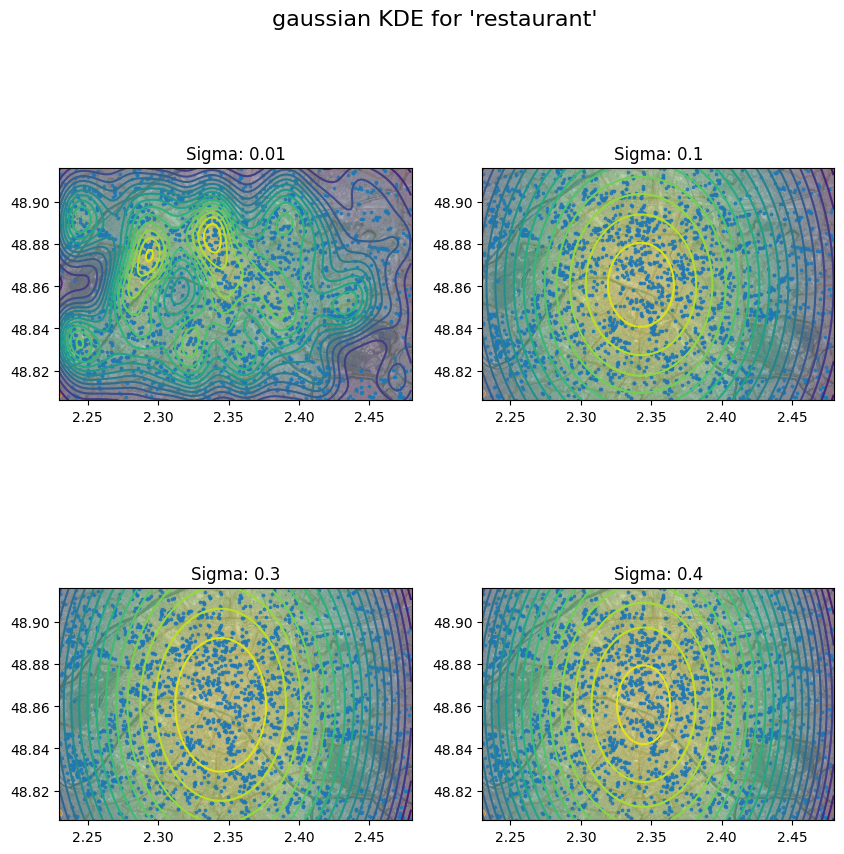

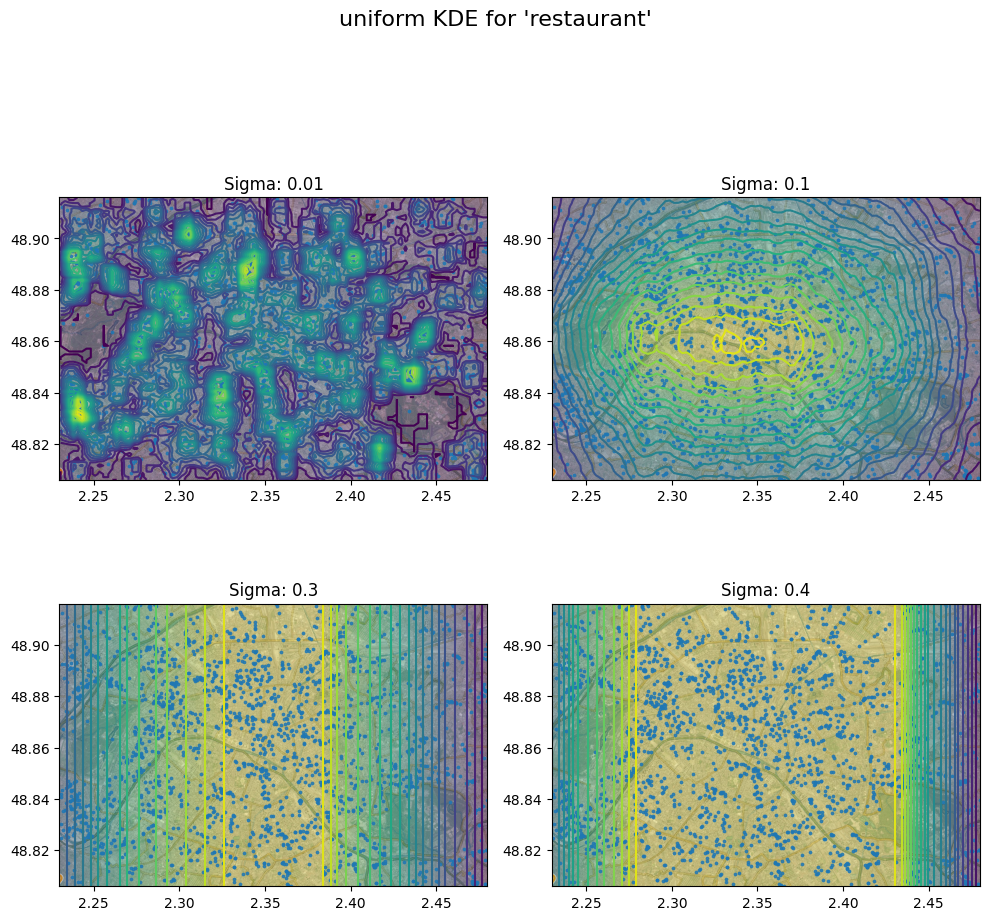

Sum of the densities for bar with sigma 0.01:  1.0
Sum of the densities for bar with sigma 0.1:  1.0
Sum of the densities for bar with sigma 0.3:  0.9999999999999999
Sum of the densities for bar with sigma 0.4:  1.0
Sum of the densities for bar with sigma 0.01:  1.0
Sum of the densities for bar with sigma 0.1:  1.0
Sum of the densities for bar with sigma 0.3:  0.9999999999999999
Sum of the densities for bar with sigma 0.4:  1.0


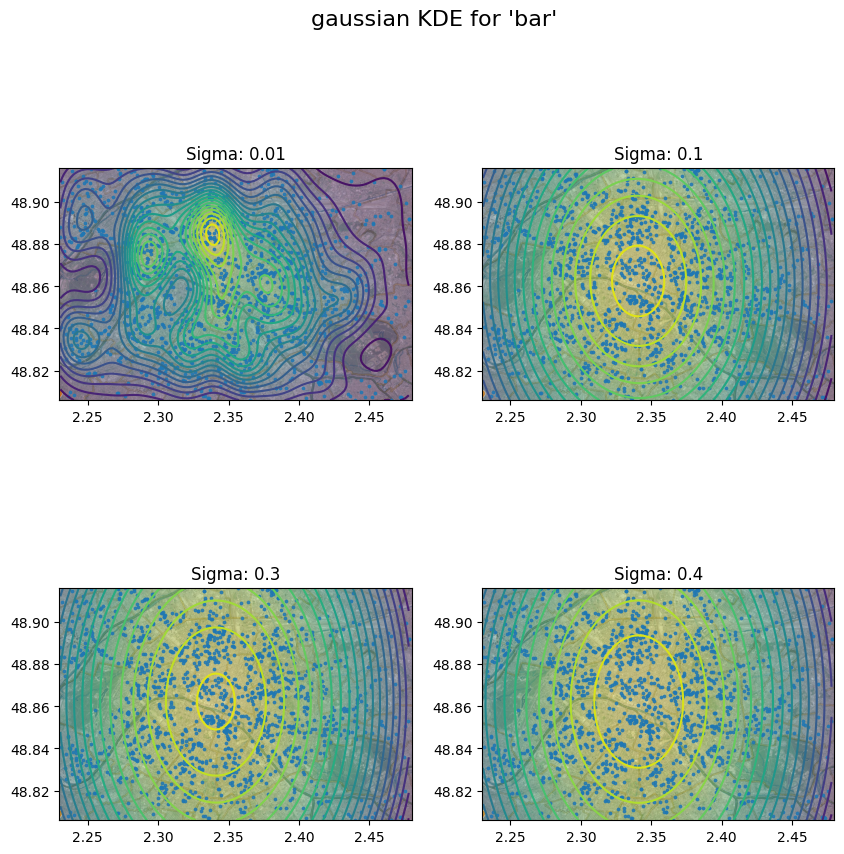

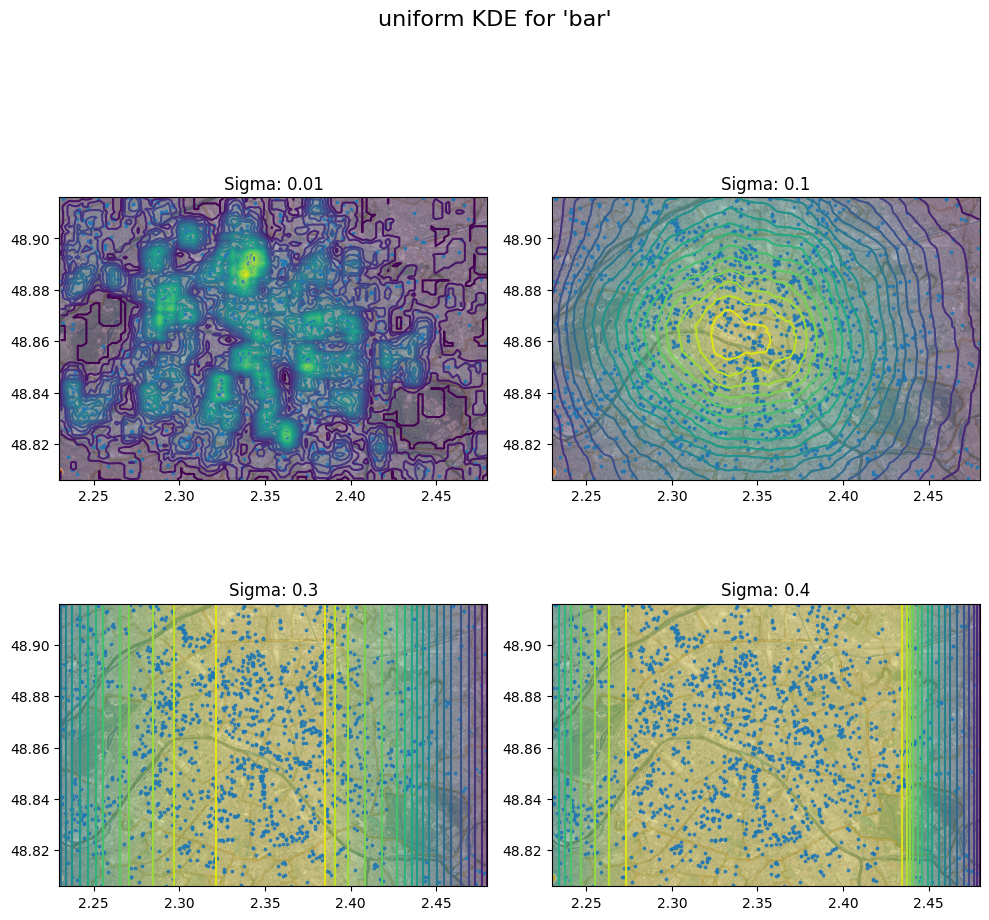

In [ ]:

sigma = [0.01,0.1, 0.3, 0.4]
data_places_kernel = ['restaurant','bar']
kernel_type = {'gaussian': kernel_gaussian, 'uniform': kernel_uniform}

for place in data_places_kernel:
    for kernel_idx, (kernel_name, kernel) in enumerate(kernel_type.items()):
        plt.figure(figsize=(10,10))
        plt.suptitle(f"{kernel_name} KDE for '{place}'", fontsize=16)

        geo_mat, notes = load_poi(place)
        np.random.shuffle(geo_mat)
        split = int(len(geo_mat) * 0.7)
        data_train  = geo_mat[:split]
        data_test = geo_mat[split:]

        for i,s in enumerate(sigma):
            plt.subplot(2,2,i+1)
            kernel_estimator = KernelDensity(kernel=kernel, sigma=s)
            kernel_estimator.fit(data_train)
            show_density_new(kernel_estimator, data_test, steps=100)
            densities = kernel_estimator.predict(data_test)
            print(f"Sum of the densities for {place} with sigma {s}: ", np.sum(densities/np.sum(densities)))
            plt.title(f"Sigma: {s}")
        
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  
    plt.show()

     



### Experiments with kernels and hyperparameter

Here as a hyperparameter we have sigma - which control the spread of the gaussian function around the point. Smaller sigma values mean more narror function and higher sigma wider function. This hyperparameter controls how smooth the function is. With too high we can get underfitting and in comparison with too small we can get overfitting.

As we can see with higher sigma values our estimator is more spread out (bigger round cicrles). With very small sigma we get localized estimation, divided by points. Again we should find a balance between overfitting and underfitting our data and findign meaningful hyperparameters. Gaussian kernel is more smooth comapred to uniform kernel which creates rectangular shapes. We can observe more flexibility with Gaussian kernel. 

With very large sigma we can observe that the kernel is outside of the space, so the estimation is invalid. We should be careful in choosing sigma given our data space.

### Likelihood for kernel estimation

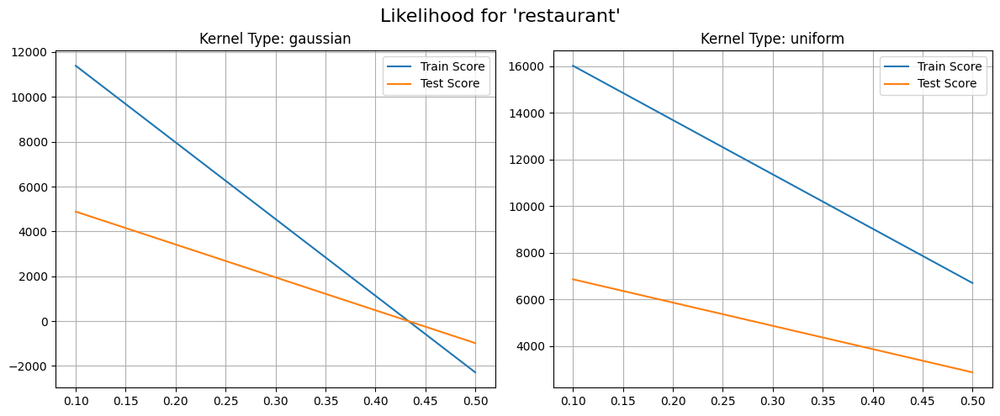

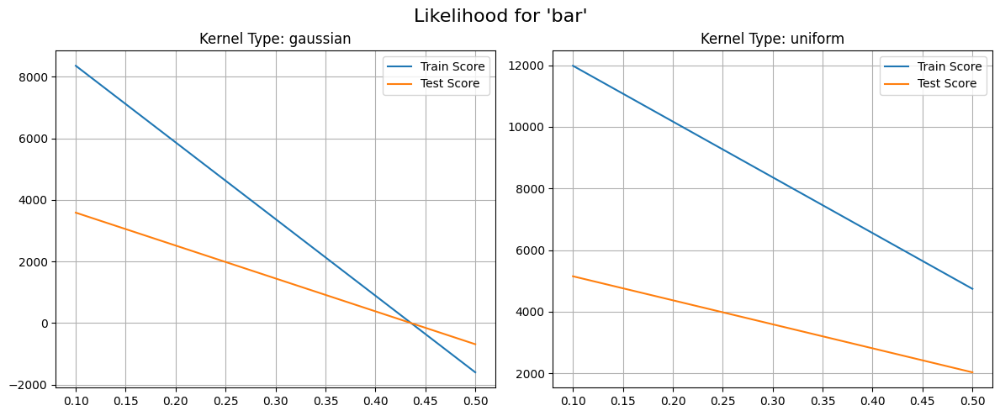

In [12]:
np.random.seed(2)

sigma = [0.1,0.5]
data_places_kernel = ['restaurant','bar']
kernel_type = {'gaussian': kernel_gaussian, 'uniform': kernel_uniform}

for place in data_places_kernel:
        plt.figure(figsize=(12,5))
        plt.suptitle(f"Likelihood for '{place}'", fontsize=16)
        for kernel_idx, (kernel_name, kernel) in enumerate(kernel_type.items()):

            geo_mat, notes = load_poi(place)
            np.random.shuffle(geo_mat)
            split = int(len(geo_mat) * 0.7)
            data_train  = geo_mat[:split]
            data_test = geo_mat[split:]

            log_likelihood_train = []
            log_likelihood_test = []

            for i,s in enumerate(sigma):
                
                kernel_estimator = KernelDensity(kernel=kernel, sigma=s)
                kernel_estimator.fit(data_train)
                log_likelihood_train.append(kernel_estimator.score(data_train))
                log_likelihood_test.append(kernel_estimator.score(data_test))
                
            plt.subplot(1,2,kernel_idx+1)
            plt.plot(sigma, log_likelihood_train, label='Train Score')
            plt.plot(sigma, log_likelihood_test, label='Test Score')
            plt.title(f"Kernel Type: {kernel_name}")
            plt.legend()
            plt.grid()
    
        plt.tight_layout()
        plt.subplots_adjust(top=0.88)
        plt.show()

     



### Likelihood results

From the likelihood graph we can observe that with higher sigma values the log-likelihood decreases. We want high likelihood values because that means we can estimate the density better. We can observe that train likelihood is much higher than test likelihood which can indicate overfitting of out estimator. We aim for high test likelihood as it shows how generalizable the estimation is. That is why we should choose sigma for which we get high likelihood for both train and test data. In this case, medium values of sigma seems to be the best both values quite high but relatively closer to each other. We can also observe that for gaussian kernel train and test scores are closer to each other than in the uniform kernel. Ideally we would want to lines to be the same which is unfortunatelly not the case for us. 

## Nadarya_Watson Regressor

Methods used for classification and estimation by weightening the values by its average. 

In [69]:
class Nadaraya(Density):
    def __init__(self,kernel=None,sigma=0.1):
        Density.__init__(self)
        self.kernel = kernel
        self.sigma = sigma
    def fit(self,x,y):
        self.x = x
        self.y = y.ravel()
        

    def predict(self, data):
        predictions = []
        for point_x0 in data:
            pred = np.sum(self.y * self.kernel((self.x-point_x0)/self.sigma)) / np.sum(self.kernel((self.x-point_x0)/self.sigma))
            predictions.append(pred)
        return np.array(predictions)

In [28]:
def mean_squared_error(y_true, y_pred):
    return np.mean((y_true - y_pred) ** 2)


In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split  
import matplotlib.pyplot as plt

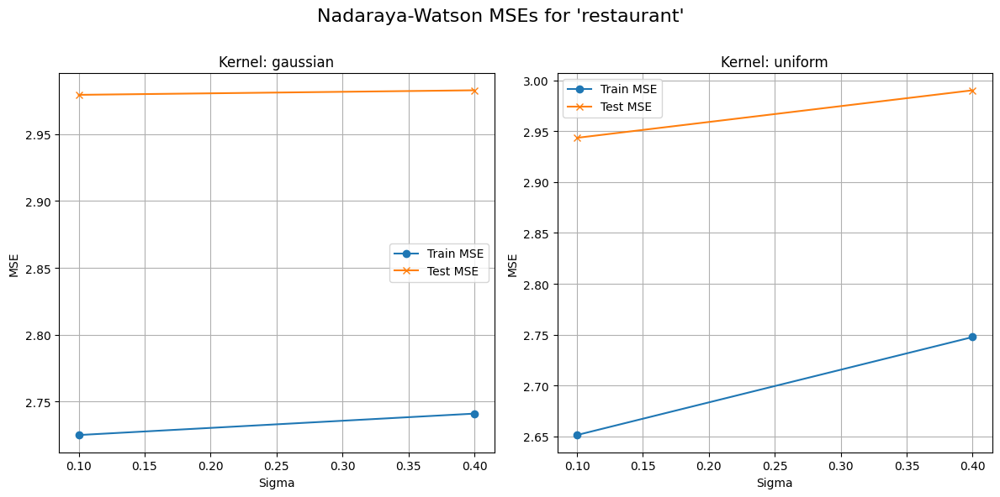

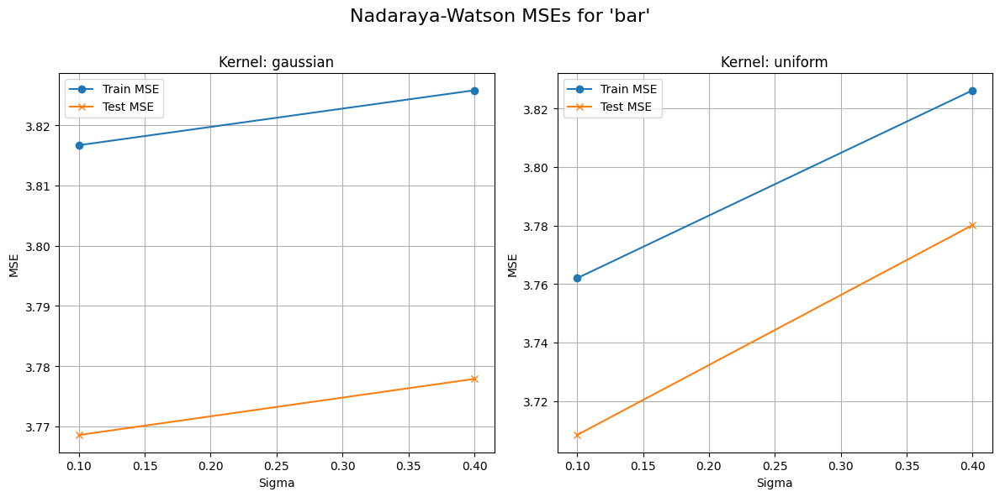

In [71]:
sigma = [0.1, 0.4]
data_places_kernel = ['restaurant', 'bar']

for place in data_places_kernel:
    geo_mat, notes = load_poi(place)  
    x_train, x_test, y_train, y_test = train_test_split(geo_mat, notes, test_size=0.3, random_state=42)

    plt.figure(figsize=(12, 6))
    plt.suptitle(f"Nadaraya-Watson MSEs for '{place}'", fontsize=16)

    for kernel_idx, (kernel_name, kernel) in enumerate(kernel_type.items()):
        mse_train = []
        mse_test = []

        for s in sigma:
            nadaraya_estimator = Nadaraya(kernel=kernel, sigma=s)
            nadaraya_estimator.fit(x_train, y_train)
            pred_train = nadaraya_estimator.predict(x_train)
            pred_test = nadaraya_estimator.predict(x_test)
            mse_train.append(mean_squared_error(pred_train, y_train))
            mse_test.append(mean_squared_error(pred_test, y_test))

        plt.subplot(1, len(kernel_type), kernel_idx + 1)
        plt.plot(sigma, mse_train, label='Train MSE', marker='o')
        plt.plot(sigma, mse_test, label='Test MSE', marker='x')
        plt.title(f"Kernel: {kernel_name}")
        plt.xlabel('Sigma')
        plt.ylabel('MSE')
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()


### Nadaraya regressor results

To study the performance of the estimator we calculated the mean squared error loss. We can observe high train error which is counterintuitive since we would assume the model predicts better the data it has been trained on. However, it is not the case here. We can see that for location = bar the error increases with sigma values. In this case for uniform kernel the functions are a bit closer (at least for bar) than for gaussian kernel. Based on this performance it is hard to differentiate with confidence which kernel is better. 

Note: The code took a long time to run, due to unvectorized prediction. 